# A. Problem statement

Almost every big and mid sized organizations utilize a support ticket system. Servicenow is one of the most commonly used support ticket system across all organizations .

A support request is raised by users in Servicenow for any hardware or software related issues- like procurement of new desktop , creation of an Office365 account etc. These tickets are then assigned to the appropriate technical support team by a L1 Engineer.

Our Aim is to automate the work of this L1 engineer and to assign the tickets to the appropriate technical support team.

# B. Data collection

We can collect data from Servicenow. Filter data according to your need.
- Right click on the hamburger icon on of the column as shown in figure.
- Click on Export->CSV.

CSV file will be downloaded which we can read using Pandas library.
![Report](Asset/report.jpg "Report")
**Figure 1** - Report

# Import modules and read data

In [1]:
# To read and manupulate dataframe
import pandas as pd

# For EDA
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)
%matplotlib inline

In [2]:
incident_df = pd.read_csv('incident.csv', encoding='ISO-8859-1')

# C. Data cleaning
- I will only keep 3 columns.
- **Short description:** Short description of issue
- **Description:** Issue in more elaborated form
- **Assignment group:** Ticket assignment group. Our target variable

In [3]:
df1 = incident_df[['Short description','Description','Assignment group']]

## C1. Missing values

In [4]:
# Function to check and create dataframe for missing value
def check_miss(df):
    '''
    This function will check number and % of missing value in each column 
    if it is more than 0 then it will return a dataframe
    '''

    #Column which have missing value
    miss_col = [col for col in df.columns if df[col].isnull().sum()>0]

    #DataFrame that contains no. and % of missing value
    miss_df = pd.DataFrame([df[miss_col].isnull().sum(),df[miss_col].isnull().mean()*100],
                          index=['Missing Value','Missing Value %'])
    
    return miss_df

In [5]:
check_miss(df1)

,Short description,Description,Assignment group
Missing Value,43.000000,1587.000000,43.000000
Missing Value %,0.067054,2.474777,0.067054


I will be droping rows containing missing values. There are two reason for doing so.

1. Less missing values compare to data size.
2. We can't interpret missing values for test and target data in this case. 

In [6]:
df2 = df1.copy()
df2.dropna(inplace=True)

## C2. Cleaning text data

There are two ways to create a ticket. Either user can call L1 team and they can raise ticket on behalf of user or user himself/herself can raise a ticket.

When L1 team raise a ticket they follow a format which contain lot of unnecessary text in description which I will removing using regex.

In [7]:
df3 = df2.copy()
df3['Description'] = df2['Description'].apply(lambda x: x[:x.find('Issue Status:')])

# D. EDA

## D1. Target variable

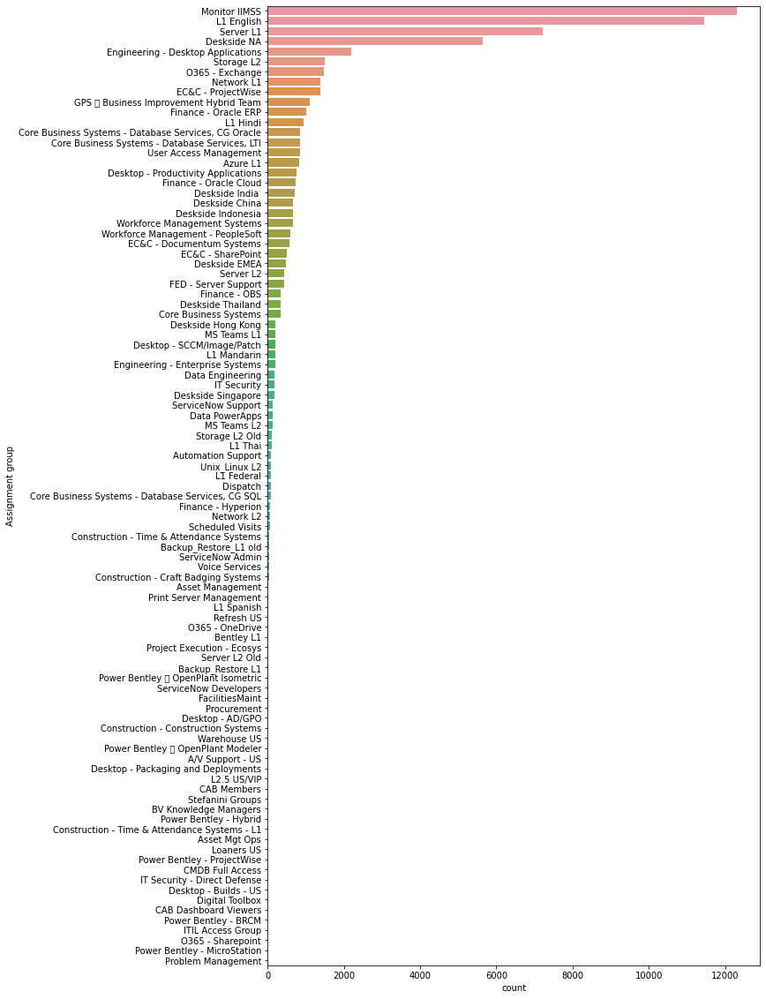

In [8]:
plt.figure(figsize=(10,20))
sns.countplot(y=df3['Assignment group'],order=df3['Assignment group'].value_counts().index)
plt.show()

There are many assignment group whose data is not sufficient. I will remove groups whose value count is less than 200.

I will do this in two step:

1. Create a list of assignment group whose value count is less than 200.
2. Delete rows who is not there in assignment group list.

In [9]:
assignment_group=[]
for key,value in df3['Assignment group'].value_counts().iteritems():
    if value>=200:
        assignment_group.append(key)

In [10]:
df4 = df3[df3['Assignment group'].isin(assignment_group)]

## D2. Short description

I will split this into part.

1. I will see length of short description for each assginment group.
2. I will see most word used in short description for each assginment group. 

In [11]:
df5 = df4.copy()
df5['short_count'] = df4['Short description'].apply(lambda x: len(x))

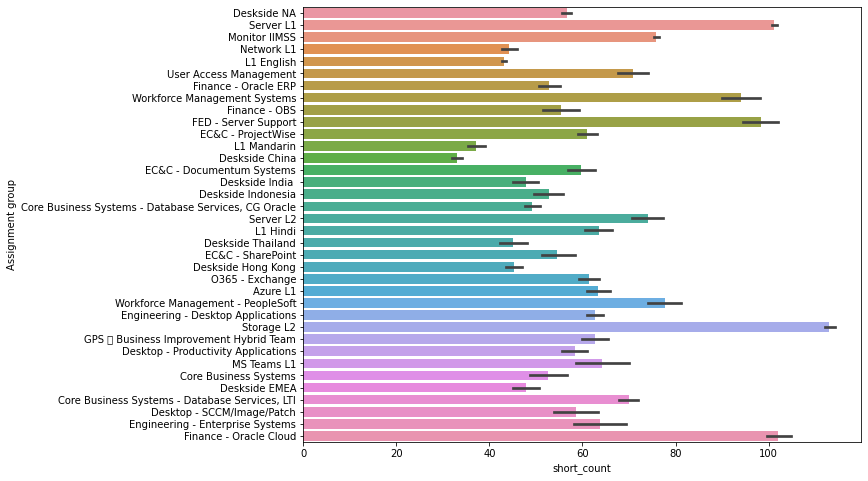

In [12]:
plt.figure(figsize=(10,8))
sns.barplot(x=df5['short_count'],y=df5['Assignment group'])
plt.show()

### Wordcloud

In [13]:
text = df5.groupby('Assignment group')['Short description'].apply(lambda x: " ".join(x))

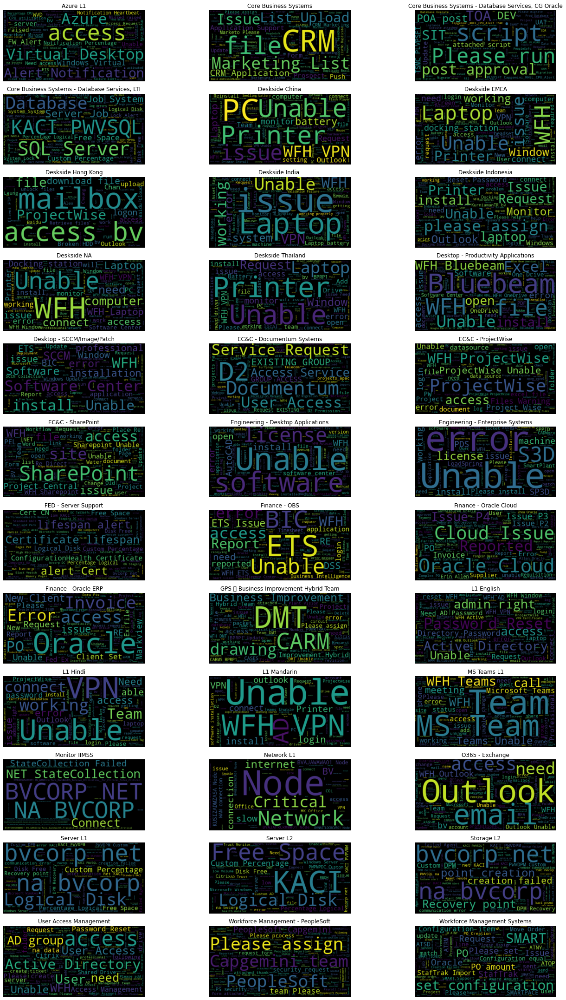

In [14]:
index = 0
plt.figure(figsize=(20,30))
for key,value in text.iteritems():
    # Create and generate a word cloud image:
    wordcloud = WordCloud(stopwords=stopwords).generate(str(value))
    index+=1
    plt.subplot(12,3,index)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(key)
plt.tight_layout()    

## D3. Description

I will split this into part.

1. I will see length of description for each assginment group.
2. I will see most word used in description for each assginment group. 

In [15]:
df6 = df5.copy()
df6['count'] = df5['Description'].apply(lambda x: len(x))

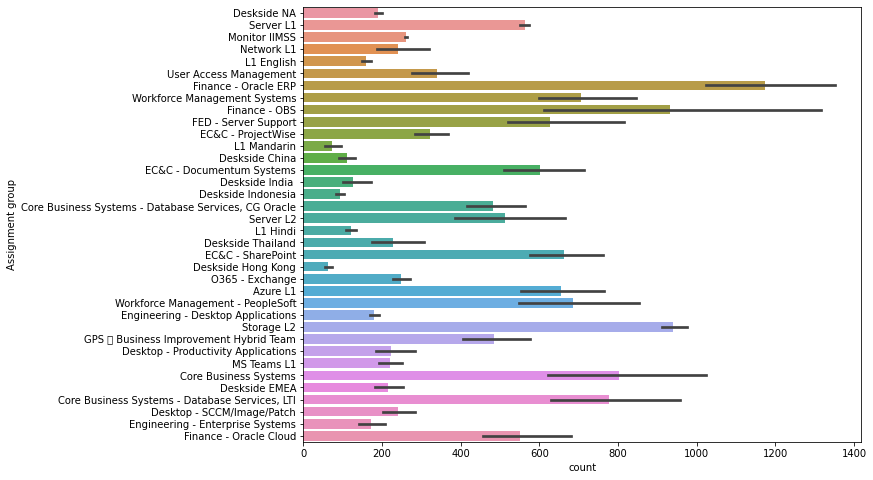

In [16]:
plt.figure(figsize=(10,8))
sns.barplot(x=df6['count'],y=df6['Assignment group'])
plt.show()

### Wordcloud

In [17]:
text = df6.groupby('Assignment group')['Description'].apply(lambda x: " ".join(x))

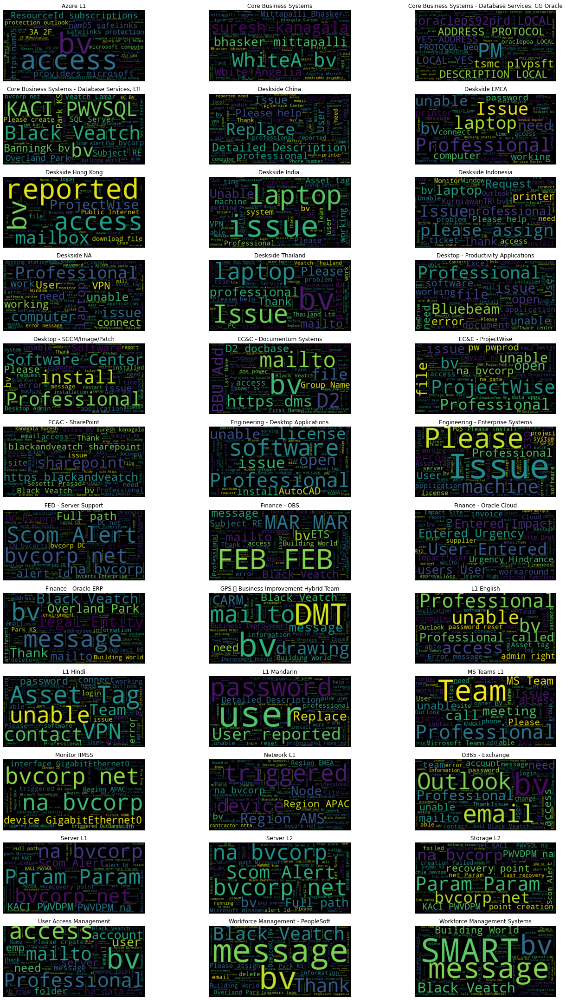

In [18]:
index = 0
plt.figure(figsize=(20,30))
for key,value in text.iteritems():
    # Create and generate a word cloud image:
    wordcloud = WordCloud(stopwords=stopwords).generate(str(value))
    index+=1
    plt.subplot(12,3,index)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(key)
plt.tight_layout()

I observe that for each assignment group there are some common word used in there short description and description. 

For example in EC&C - Projectwise Projectwise is the common word used.

*Refer model.py file for Model building steps* 